<a href="https://colab.research.google.com/github/agkabir/SalesProfitAnalysis/blob/main/kabir_02807_Project_2_Exercise_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 02807: Project 2
 
## Practical information
 
* This project must be completed in groups of 3 students.
* This project must be handed in as a Google Colab notebook to the course site on DTU Inside. Go to the Assignments tab to upload your submission. 
* This project is due on Monday, November 30, 20:00.
* Each group has to hand in *one* notebook with their solutions.
* Your code must be written in Python/PySpark.
* For each question you may use as many cells for your solution as you like.
* You should not remove the problem statements.
* Your notebook should be runnable, i.e., clicking in the code cells should display the result that you want to have assessed.  
* You are not expected to use machine learning to solve any of the exercises.
 
## Colaboration policy
 
* It is not allowed to collaborate on the exercises with students outside your group, except for discussing the text of the exercise with teachers and fellow students enrolled on the course in the same semester. 
* It is not allowed to exchange, hand-over or in any other way communicate solutions or parts of solutions to the exercises. 
* It is not allowed to use solutions from similar courses, or solutions found elsewhere.

## Contribution table and grading

* The total amount of points in the project is 105.
* You have to indicate who has solved each part of each exercise in a **contribution table**. 
* The following is an example of a contribution table:

|        | Exercise 1 | Exercise 2 | Exercise 3 | Exercise 4 |
|--------|------------|------------|------------|------------|
| **Part 1** | John       |    Mary        |     Ann       |   Mary, Ann         |
| **Part 2** |     Mary       |    Mary        |   Ann         |    John, Ann        |
| **Part 3** |     John, Mary, Ann       |      John, Ann      |   John         | **n.a.**      |
| **Part 4** | **n.a.**       |  Ann          |     John, Mary       | **n.a.**       |
| **Part 5** | **n.a.**     | John, Mary, Ann           | **n.a.**       | **n.a.**       |
| **Part 6** | **n.a.**       | John, Mary, Ann           | **n.a.**      | **n.a.**      |

* A group member can take credit for solving a part of an exercise only if they have contributed **substantially** to the solution. 
* Simple contributions, such as correcting a small bug or double-checking the results of functions, are not sufficient for taking credit for a solution.
* Several group members can take credit for the same solution if they all have contributed substantially to it.
* **Each group member must solve at least 105/3=35 points**. 
* **If no name is provided for an exercise's part, all group members will be assigned responsibility for it**.
* Group members should decide amongst themselves how to collaborate on the project to meet the above-mentioned constraints.  
* Grades are individual. The grade $\text{grade}(m)$ for a group member $m$ ranges from 0 to 10 and is calculated as follows: 

  * $\text{individual-score}(m) = \frac{\text{total number of points for the parts correctly solved by }m}{\text{total number of points for the parts contributed by }m}$

  * $\text{group-score} = \frac{\text{total number of points correctly solved by any group member}}{\text{total number of points in the project}}$

  * $\text{grade}(m) =  7.5 \cdot \text{individual-score}(m) + 2.5 \cdot \text{group-score}$

* **Example**: in the contribution table above, suppose that all parts are solved correctly except for those of Exercise 4, which are both wrong. Then Ann's grade is calculated as follows:

  * $\text{individual-part}(Ann) = \frac{2.5 + 2.5 + 10 + 10 + 5 + 10 + 5}{2.5 + 2.5 + 10 + 10 + 5 + 10 + 5 + 10 + 10} = \frac{45}{65} = 0.692$

  * $\text{group-part} = \frac{85}{105} = 0.809$

  * $\text{grade}(Ann) =  7.14$


# Guidelines
- Data processing should be done using PySpark. Once data has been reduced to aggregate form, you may use collect to extract it into Python for visualisation.
- Your solutions will be evaluated by correctness, code quality and interpretability of the output. This means that you have to write clean and efficient Spark code that will generate sensible execution plans, and that the tables and visualisations that you produce are meaningful and easy to read.
- You may add more cells for your solutions, but you should not modify the notebook otherwise.

# Group declaration table 

This table must be filled before submission.



In [1]:
import pandas as pd

d = { 'Exercise 2' : ["", "", "", "", "", "", "", "", ""],
     } 
  
ct = pd.DataFrame(d, index =['Part 1','Part 2.1','Part 2.2','Part 2.3','Part 2.4','Part 2.5','Part 2.6','Part 3.1','Part 3.2']) 

ct

,Exercise 2
Part 1,
Part 2.1,
Part 2.2,
Part 2.3,
Part 2.4,
Part 2.5,
Part 2.6,
Part 3.1,
Part 3.2,


### Setup Spark for colab

In [2]:
## colab installation code
!pip install price_parser
!pip install textblob
!pip install bokeh
!pip install pyspark
!pip install nltk #uncomment to install this package 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Create Spark session and define imports

In [3]:
# Let's import the libraries we will need
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import pyspark
from pyspark.sql import *
from pyspark.sql import functions as f
from pyspark import SparkContext, SparkConf
from pyspark.sql.window import Window
import sys
from price_parser import parse_price
from pyspark.sql.types import *

In [66]:
import bokeh
from bokeh.plotting import figure
from bokeh.io import output_notebook,show
from bokeh.models import ColumnDataSource, FactorRange, Legend,HoverTool
import seaborn as sns
from bokeh.resources import INLINE
output_notebook(INLINE)
from math import pi
from bokeh.layouts import gridplot
import bokeh.palettes as palette
from bokeh.transform import factor_cmap
from datetime import timedelta, datetime
import json
import requests

In [5]:
# create the session
conf = SparkConf().set("spark.ui.port", "4050")

# create the context
sc = pyspark.SparkContext(conf=conf)
spark = SparkSession.builder.getOrCreate()

# Exercise 2: sales & profit analysis (52.5 points)


## Introduction


<img src="https://www.lifeandstylemag.com/wp-content/uploads/2018/01/kevin-malone-the-office.jpg?resize=630%2C354" alt="kevin" width="600"/> 

*Kevin from accounting*



Your team has been hired by the company X as data scientists. X makes gadgets for a wide range of industrial and commercial clients.

As in-house data scientists, your teams first task, as per request from your new boss, is to optimize business operations. You have decided that a good first step would be to analyze the company's historical sales data to gain a better understanding of where profit is coming from. It may also reveal some low hanging fruit in terms of business opportunities.

To get started, you have called the IT department to get access to the customer and sales transactions database. To your horror you've been told that such a database doesn't exist, and the only record of sales transactions is kept by Kevin from accounting in an Excel spreadsheet. So you've emailed Kevin asking for a CSV dump of the spreadsheet...

In this project you need to clean the data you got from Kevin, enrich it with further data, prepare a database for the data, and do some data analysis. The project is comprised of five parts. They are intended to be solved in the order they appear, but it is highly recommended that you read through all of them and devise an overall strategy before you start implementing anything.


## Part 1: Cleaning the data (10 pts)
Kevin has emailed you the following link to the CSV dump you requested.

- [transactions.csv](http://courses.compute.dtu.dk/02807/2020/projects/project2/transactions.csv)

It seems as though he has been a bit sloppy when keeping the records. 

In this part you should:
1. Explain what the data is about
2. Inspect and clean it to prepare it for analysis. Describe the problems you found in the data, and how you addressed them.

#Mounting google drive

from google.colab import drive
drive.mount('/content/drive')
drive_path = '/content/drive/My Drive/project_2/data/'

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Load the data
The data has multiline rows (rows that span multiple lines in the file). To correctly parse these you should use the `multiLine` option and set the `escape` character to be `"`.

In [7]:
df_trans = spark.read.option('header', True).option('inferSchema', True).csv('/content/drive/My Drive/data/transactions.csv')
df_trans.show(5)

+----------+-------------+-------+------------+--------+-------------------+
|      part|      company|country|        city|   price|               date|
+----------+-------------+-------+------------+--------+-------------------+
|54868-5165|Chatterbridge|  Spain|   Barcelona| 784.79€|2016-01-02 00:01:05|
|60505-2867|         Lajo| Greece|Thessaloniki| 187.99€|2016-01-02 00:05:26|
| 24385-268|    Flipstorm| Greece|      Athens| 221.73€|2016-01-02 00:18:30|
| 76117-001|  Twitterbeat| France|      Annecy|1075.82€|2016-01-02 02:32:30|
|44946-1046|Chatterbridge|  Spain|   Barcelona| 412.55€|2016-01-02 04:51:55|
+----------+-------------+-------+------------+--------+-------------------+
only showing top 5 rows



### Describe the data
List the features (schema) and sizes of the datasets.

In [8]:
df_trans.printSchema()
print('Size of transactions datasets {}'.format(df_trans.count()))

root
 |-- part: string (nullable = true)
 |-- company: string (nullable = true)
 |-- country: string (nullable = true)
 |-- city: string (nullable = true)
 |-- price: string (nullable = true)
 |-- date: string (nullable = true)

Size of transactions datasets 20568


### Prepare the data for analysis
You should prepare two dataframes to be used in the analysis part of the project. You should not be concerned with cleaning the data. There's a lot of it, so it will be sufficient to drop rows that have bad values. You may want to go back and refine this step at a later point when doing the analysis.


In [9]:
df_trans.select([f.count(f.when(f.isnan(c) | f.col(c).isNull(), c)).alias(c) for c in df_trans.columns]).show()

+----+-------+-------+----+-----+----+
|part|company|country|city|price|date|
+----+-------+-------+----+-----+----+
|  10|      0|   2171|  33|    1|   0|
+----+-------+-------+----+-----+----+



In [10]:
df_trans = df_trans.dropna(how='any', subset='price')
df_trans.select([f.count(f.when(f.isnan(c) | f.col(c).isNull(), c)).alias(c) for c in df_trans.columns]).show()

+----+-------+-------+----+-----+----+
|part|company|country|city|price|date|
+----+-------+-------+----+-----+----+
|  10|      0|   2171|  33|    0|   0|
+----+-------+-------+----+-----+----+



In [11]:
#df_trans_gp = df_trans.select("company").distinct().show(40)
#df_trans.select(f.countDistinct("company")).show()
df_trans.groupBy('company').agg(f.count('company')).show()

+-------------+--------------+
|      company|count(company)|
+-------------+--------------+
|            a|             1|
|       Zooxo.|             2|
|Chatterbridge|          1589|
|      Tagtune|            12|
|        Gevee|            36|
|    Flipstorm|          1193|
|      Gabcube|           357|
|    Bubblemix|            54|
|      Gabtune|            27|
|      Rhycero|           204|
|        Voomm|           250|
|        Ntags|          1514|
|      Zoonder|           454|
|      Wordify|           968|
|       Roodel|           626|
|        Yozio|           655|
|         Laj0|             1|
|       Eimbee|           498|
|         Lajo|           220|
|     Kanoodle|           127|
+-------------+--------------+
only showing top 20 rows



In [12]:
df_trans_up = df_trans.withColumn("company",f.when(f.col("company") == "Zooxo.", "Zooxo").when(f.col("company") == "Laj0", "Lajo")\
                               .when(f.col("company") == "Ntagz", "Ntags").when(f.col("company") == "Thoughtmixz", "Thoughtmix").otherwise(f.col("company")))
df_trans_up.show(3)

+----------+-------------+-------+------------+-------+-------------------+
|      part|      company|country|        city|  price|               date|
+----------+-------------+-------+------------+-------+-------------------+
|54868-5165|Chatterbridge|  Spain|   Barcelona|784.79€|2016-01-02 00:01:05|
|60505-2867|         Lajo| Greece|Thessaloniki|187.99€|2016-01-02 00:05:26|
| 24385-268|    Flipstorm| Greece|      Athens|221.73€|2016-01-02 00:18:30|
+----------+-------------+-------+------------+-------+-------------------+
only showing top 3 rows



In [13]:
df_trans_up.groupBy('company').agg(f.count('company')).show()

+-------------+--------------+
|      company|count(company)|
+-------------+--------------+
|            a|             1|
|Chatterbridge|          1589|
|      Tagtune|            12|
|        Gevee|            36|
|    Flipstorm|          1193|
|      Gabcube|           357|
|    Bubblemix|            54|
|      Gabtune|            27|
|      Rhycero|           204|
|        Voomm|           250|
|        Ntags|          1515|
|      Zoonder|           454|
|      Wordify|           968|
|       Roodel|           626|
|        Yozio|           655|
|       Eimbee|           498|
|         Lajo|           221|
|     Kanoodle|           127|
|    Realpoint|           158|
|  Shufflebeat|          1553|
+-------------+--------------+
only showing top 20 rows



In [14]:
drop_company_list = [' a','aa',' -']
df_trans_up_filter = df_trans_up.filter(~f.col('company').isin(drop_company_list))
df_trans_up_filter.groupBy('company').agg(f.count('company')).show(4)

+-------------+--------------+
|      company|count(company)|
+-------------+--------------+
|Chatterbridge|          1589|
|      Tagtune|            12|
|        Gevee|            36|
|    Flipstorm|          1193|
+-------------+--------------+
only showing top 4 rows



In [15]:
df_trans_only_date = df_trans_up_filter.withColumn('date_only',f.to_date(f.col('date')).cast('date'))
df_trans_only_date.show(3)
min_date, max_date = df_trans_only_date.select(f.min("date_only"), f.max("date_only")).first()

+----------+-------------+-------+------------+-------+-------------------+----------+
|      part|      company|country|        city|  price|               date| date_only|
+----------+-------------+-------+------------+-------+-------------------+----------+
|54868-5165|Chatterbridge|  Spain|   Barcelona|784.79€|2016-01-02 00:01:05|2016-01-02|
|60505-2867|         Lajo| Greece|Thessaloniki|187.99€|2016-01-02 00:05:26|2016-01-02|
| 24385-268|    Flipstorm| Greece|      Athens|221.73€|2016-01-02 00:18:30|2016-01-02|
+----------+-------------+-------+------------+-------+-------------------+----------+
only showing top 3 rows



In [16]:
df_trans_only_date_str = df_trans_only_date.withColumn('date_only',f.col('date_only').cast('string'))
df_trans_only_date_str.show(3)

+----------+-------------+-------+------------+-------+-------------------+----------+
|      part|      company|country|        city|  price|               date| date_only|
+----------+-------------+-------+------------+-------+-------------------+----------+
|54868-5165|Chatterbridge|  Spain|   Barcelona|784.79€|2016-01-02 00:01:05|2016-01-02|
|60505-2867|         Lajo| Greece|Thessaloniki|187.99€|2016-01-02 00:05:26|2016-01-02|
| 24385-268|    Flipstorm| Greece|      Athens|221.73€|2016-01-02 00:18:30|2016-01-02|
+----------+-------------+-------+------------+-------+-------------------+----------+
only showing top 3 rows



In [17]:
df_trans_only_date_str.select([f.count(f.when(f.isnan(c) | f.col(c).isNull(), c)).alias(c) for c in df_trans_only_date_str.columns]).show()

+----+-------+-------+----+-----+----+---------+
|part|company|country|city|price|date|date_only|
+----+-------+-------+----+-----+----+---------+
|  10|      0|   2171|  33|    0|   0|        9|
+----+-------+-------+----+-----+----+---------+



In [18]:
df_trans_only_date_fill_na = df_trans_only_date_str.withColumn('date_only',f.first(f.col('date_only'),ignorenulls=True) \
    .over(Window.orderBy('date_only').rowsBetween(0, sys.maxsize)))
df_trans_only_date_fill_na.select([f.count(f.when(f.isnan(c) | f.col(c).isNull(), c)).alias(c) for c in df_trans_only_date_fill_na.columns]).show()

+----+-------+-------+----+-----+----+---------+
|part|company|country|city|price|date|date_only|
+----+-------+-------+----+-----+----+---------+
|  10|      0|   2171|  33|    0|   0|        0|
+----+-------+-------+----+-----+----+---------+



In [19]:
df_trans_only_date_fill_na_part_drop_na = df_trans_only_date_fill_na.dropna(how='any', subset='part')

## Part 2: Analyzing the data (32.5 pts)
You are now ready to analyze the data. Your goal is to gain some actionable business insights to present to your boss. 

In this part, you should ask some questions and try to answer them based on the data. You should write SQL queries to retrieve the data for at least 3 out of the 6 parts below (2.1,..., 2.6). The remaining ones must be done with Spark functions). 

As you start to look into the questions, you'll realise that you need to enrich your data. For example: transaction prices are recorded in the local currency of the client (EUR, GBP, USD or JPY). You will need to convert these prices from local currency into a common currency such as EUR, for comparability. Describe the enrichments, as you perform them.

Remember, you are taking this to your new boss, so think about how you present the data. Include headers, legends and well-written descriptions for graphs/charts. Think of the solutions you provide as an "executive summary" of your findings. You should put an effort in presentation and writing, not just coding.




In [20]:
cur_sym_code_dict = {'¥':'JPY','$':'USD','£':'GBP','€':'EUR'}

In [21]:
def getRates(start_date, end_date):
  url = "https://api.apilayer.com/exchangerates_data/timeseries?start_date="+start_date+"&end_date="+end_date+"&symbols=GBP,JPY,USD"
  payload = {}
  headers= {
  "apikey": "sjCLCjjBNDfJDW74OqUXXtU6hXAF58vO"}
  response = requests.request("GET", url, headers=headers, data = payload)
  status_code = response.status_code
  result = response.text
  rates = json.loads(result)['rates']
  return rates

In [22]:
days = (max_date - min_date).days
if days > 365:
  allRate = {}
  for i in range(days//265):
    allRate.update(getRates((min_date + timedelta(i*365)).strftime("%Y-%m-%d"), (min_date + timedelta((i+1)*365)).strftime("%Y-%m-%d")))
  allRate.update(getRates((min_date + timedelta((days//365)*365)).strftime("%Y-%m-%d"), max_date.isoformat()))
else:
  allRate = getRates(min_date.isoformat(), max_date.isoformat())

In [23]:
def currency_amount(priceString):
  curr_amount = parse_price(priceString).amount_float
  return curr_amount

currency_amount_udf = f.udf(currency_amount, DoubleType())

In [24]:
def currency_symbol_code(priceString):
  try:
    curr_symbol_code = cur_sym_code_dict[parse_price(priceString).currency]
  except KeyError as error:
    curr_symbol_code = None
  
  return curr_symbol_code

currency_symbol_code_udf = f.udf(currency_symbol_code, StringType())

In [25]:
def check_transaction_date(t_date):
  if not (allRate.get(t_date) is None):
    return t_date
  else:
    date_tt = (datetime.strptime(t_date, '%Y-%m-%d').date() - timedelta(1)).strftime("%Y-%m-%d")
    return check_transaction_date(str(date_tt))

In [26]:
def currency_converter(amount,cur_code,transaction_date):
  if cur_code != 'EUR':
    #t_date = transaction_date.isoformat()
    #print(transaction_date)
    trans_date = check_transaction_date(transaction_date)
    converted_amount = round(amount / (allRate[trans_date][cur_code]),2)
  else:
    converted_amount = amount
  return converted_amount

currency_converted_udf = f.udf(currency_converter, DoubleType())

In [27]:
df_trans_up_filter_curr = df_trans_only_date_fill_na_part_drop_na.withColumn('amount', currency_amount_udf(f.col('price')))
df_trans_up_filter_curr.show(3)

+----------+-----------+--------+---------+-------+-------------------+----------+------+
|      part|    company| country|     city|  price|               date| date_only|amount|
+----------+-----------+--------+---------+-------+-------------------+----------+------+
| 17156-617| Thoughtmix|Portugal|Amadora\t|791.86€|2016-06-32 07:22:28|2016-01-02|791.86|
|54868-5165|Shufflebeat|Portugal|    Porto|525.24€|2016-06-32 08:08:48|2016-01-02|525.24|
| 0615-7679| Thoughtmix|Portugal|Amadora\t|314.43€|         10/04/2017|2016-01-02|314.43|
+----------+-----------+--------+---------+-------+-------------------+----------+------+
only showing top 3 rows



In [28]:
df_trans_up_filter_curr_code = df_trans_up_filter_curr.withColumn('currency_code', currency_symbol_code_udf(f.col('price')))
df_trans_up_filter_curr_code.show(3)

+----------+-----------+--------+---------+-------+-------------------+----------+------+-------------+
|      part|    company| country|     city|  price|               date| date_only|amount|currency_code|
+----------+-----------+--------+---------+-------+-------------------+----------+------+-------------+
| 17156-617| Thoughtmix|Portugal|Amadora\t|791.86€|2016-06-32 07:22:28|2016-01-02|791.86|          EUR|
|54868-5165|Shufflebeat|Portugal|    Porto|525.24€|2016-06-32 08:08:48|2016-01-02|525.24|          EUR|
| 0615-7679| Thoughtmix|Portugal|Amadora\t|314.43€|         10/04/2017|2016-01-02|314.43|          EUR|
+----------+-----------+--------+---------+-------+-------------------+----------+------+-------------+
only showing top 3 rows



In [29]:
df_trans_up_filter_curr_code.select('currency_code').distinct().show()

+-------------+
|currency_code|
+-------------+
|          GBP|
|         null|
|          EUR|
|          JPY|
|          USD|
+-------------+



In [30]:
df_trans_up_filter_curr_code_drop_na = df_trans_up_filter_curr_code.dropna(how='any', subset='currency_code')
df_trans_up_filter_curr_code_drop_na.show(3)

+----------+-----------+--------+---------+-------+-------------------+----------+------+-------------+
|      part|    company| country|     city|  price|               date| date_only|amount|currency_code|
+----------+-----------+--------+---------+-------+-------------------+----------+------+-------------+
| 17156-617| Thoughtmix|Portugal|Amadora\t|791.86€|2016-06-32 07:22:28|2016-01-02|791.86|          EUR|
|54868-5165|Shufflebeat|Portugal|    Porto|525.24€|2016-06-32 08:08:48|2016-01-02|525.24|          EUR|
| 0615-7679| Thoughtmix|Portugal|Amadora\t|314.43€|         10/04/2017|2016-01-02|314.43|          EUR|
+----------+-----------+--------+---------+-------+-------------------+----------+------+-------------+
only showing top 3 rows



In [31]:
df_trans_up_filter_curr_code_drop_na.select('currency_code').distinct().show()

+-------------+
|currency_code|
+-------------+
|          GBP|
|          EUR|
|          JPY|
|          USD|
+-------------+



In [32]:
df_trans_converted_curr = df_trans_up_filter_curr_code_drop_na.withColumn('converted_amount', currency_converted_udf(f.col('amount'), f.col('currency_code'),f.col('date_only')))

In [33]:
df_trans_converted_curr.show(3)

+----------+-----------+--------+---------+-------+-------------------+----------+------+-------------+----------------+
|      part|    company| country|     city|  price|               date| date_only|amount|currency_code|converted_amount|
+----------+-----------+--------+---------+-------+-------------------+----------+------+-------------+----------------+
| 17156-617| Thoughtmix|Portugal|Amadora\t|791.86€|2016-06-32 07:22:28|2016-01-02|791.86|          EUR|          791.86|
|54868-5165|Shufflebeat|Portugal|    Porto|525.24€|2016-06-32 08:08:48|2016-01-02|525.24|          EUR|          525.24|
| 0615-7679| Thoughtmix|Portugal|Amadora\t|314.43€|         10/04/2017|2016-01-02|314.43|          EUR|          314.43|
+----------+-----------+--------+---------+-------+-------------------+----------+------+-------------+----------------+
only showing top 3 rows



# Added month, year and month_year column with the dataset 

In [34]:
df_trans_month = df_trans_converted_curr.withColumn("month", f.month(f.col('date_only')))
df_trans_year = df_trans_month.withColumn("year", f.year(f.col('date_only')))
df_trans_cleaned = df_trans_year.withColumn("month_year", df_trans_year.year*100 + df_trans_year.month)
df_trans_cleaned.cache()
df_trans_cleaned.createOrReplaceTempView("df_trans_cleaned")
df_trans_cleaned.show(10)

+----------+-------------+-------------+---------+--------+-------------------+----------+-------+-------------+----------------+-----+----+----------+
|      part|      company|      country|     city|   price|               date| date_only| amount|currency_code|converted_amount|month|year|month_year|
+----------+-------------+-------------+---------+--------+-------------------+----------+-------+-------------+----------------+-----+----+----------+
| 17156-617|   Thoughtmix|     Portugal|Amadora\t| 791.86€|2016-06-32 07:22:28|2016-01-02| 791.86|          EUR|          791.86|    1|2016|    201601|
|54868-5165|  Shufflebeat|     Portugal|    Porto| 525.24€|2016-06-32 08:08:48|2016-01-02| 525.24|          EUR|          525.24|    1|2016|    201601|
| 0615-7679|   Thoughtmix|     Portugal|Amadora\t| 314.43€|         10/04/2017|2016-01-02| 314.43|          EUR|          314.43|    1|2016|    201601|
| 35356-325|      Wordify|United States| New York| $330.75|         10/04/2017|2016-01-0

# Answer
The provided data is the historical transaction over a 3 years of period. To make our analysis realistic we need to convert the currency in historical foreign exchange rates. For this reason we have used exchangeratesapi.io API which fetch historical foreign exchange rates published by the European Central Bank. In the exchange rates we found some missing dates to overcome those situation we have used a recursion function which retrived the last available exchange rates.

### Who are the most profitable clients? (20 pts)

Knowing which clients that generate the most revenue for the company will assist your boss in distributing customer service ressources. Answer the following questions and provide appropriate visualisations for each of them. As mentioned before, include headers, legends and well-written descriptions for graphs/charts.


#### 2.1. How much revenue has each customer generated? (2.5 pts)

Compute and plot how much revenue each customer has generated over the three-year period. Write a paragraph describing the findings.


In [68]:
query ="""
SELECT company, SUM(converted_amount) AS total_revenue, COUNT(part) AS order_counts, AVG(converted_amount) as Average FROM df_trans_cleaned GROUP BY company
  ORDER BY total_revenue DESC"""
rev_gen_by_cust_pd = spark.sql(query).toPandas()
rev_gen_by_cust_pd.head(10)

,company,total_revenue,order_counts,Average
0,Thoughtmix,1626805.16,2792,582.666605
1,Twitterbeat,1325104.02,2265,585.034887
2,Zooxo,998125.73,1672,596.965150
3,Shufflebeat,922924.72,1553,594.285074
4,Chatterbridge,921110.90,1587,580.410145
5,Ntags,846252.55,1514,558.951486
6,Brainsphere,720802.94,1241,580.824287
7,Buzzbean,713758.43,1251,570.550304
8,Flipstorm,673246.21,1192,564.803867
9,Wordify,533931.68,968,551.582314


In [69]:
print('Average revenue per customer : {}'.format(sum(rev_gen_by_cust_pd['total_revenue'])/ len(rev_gen_by_cust_pd['total_revenue'])))
print('50 % of total revenue is : {}'.format(sum(rev_gen_by_cust_pd['total_revenue'])*0.5))

Average revenue per customer : 423976.30071428564
50 % of total revenue is : 5935668.209999999


In [70]:
company_range =rev_gen_by_cust_pd['company']
src = ColumnDataSource(rev_gen_by_cust_pd)
col_company = palette.viridis(len(company_range))

In [71]:
p = figure(x_range=company_range, plot_width=950, plot_height=500, title='Score per customer',\
           x_axis_label='Customer Names', y_axis_label='Total revenue')

hover = HoverTool(tooltips = [('Total revenue EUR', '@total_revenue')])


p.vbar(x='company',top = 'total_revenue',source = src, width=0.9,fill_alpha=0.6,\
       line_color='white', fill_color=factor_cmap('company', palette=col_company, factors= company_range))
p.xgrid.grid_line_color = None
p.xaxis.major_label_orientation = pi/4
p.add_tools(hover)
show(p)

# Answer
From the above plot we can see that most of the revenue is generated by five customers. Baassically they are contributing on more than 50% of the total revenue generation.


#### 2.2. What are the top 5 most revenue-generating customers? (7.5 pts)

Identify your best 5 customers. 


In [72]:
query_top_5 ="""SELECT company, SUM(converted_amount) as Total_Revenue FROM df_trans_cleaned GROUP BY company ORDER BY SUM(converted_amount) DESC LIMIT 5"""
spark.sql(query_top_5).show()

+-------------+------------------+
|      company|     Total_Revenue|
+-------------+------------------+
|   Thoughtmix|1626805.1600000015|
|  Twitterbeat|1325104.0200000033|
|        Zooxo| 998125.7299999992|
|  Shufflebeat| 922924.7199999999|
|Chatterbridge| 921110.8999999994|
+-------------+------------------+



Are the most revenue-generating customers making particularly large purchase orders? 

Compute the answer, plot appropriately, and write a paragraph describing the findings.

In [76]:
p = figure(x_range=company_range, plot_width=1000,y_axis_type = 'log', plot_height=550, title='Score per customer',x_axis_label='Customer Names',\
           y_axis_label='Score over total revenue and number of order')

ttips=[('Total revenue EUR', '@total_revenue'), ('Total no. of orders ', '@order_counts')]


p1 = p.vbar(x='company',top='total_revenue',source=src,legend_label= 'Total Revenue', width=0.9,muted_alpha=0.2, fill_alpha=1, color='green',bottom=0.00001)
p.vbar(x='company',top='order_counts', source=src,legend_label= 'No. of orders', width=0.9, muted_alpha=0.4, fill_alpha=1, color='red',bottom=0.00001)
p.xgrid.grid_line_color = None
p.xaxis.major_label_orientation = pi/4
p.legend.click_policy="mute"
p.add_tools(HoverTool(renderers=[p1],tooltips=ttips))
show(p)

Are they making a lot of purchases? 

Compute the answer, plot appropriately, and write a paragraph describing the findings.


# Answer
The above plot shows the total revenue and number of order purchased by every company. The y-axis scale is log scale because the scale of revenue is comparatively very hihger than order purchased. We can see that the in general the companies who are contributing on high revenue purchased a lot of orders. The plot can also be view as muted view by clicking on the legend label. 


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


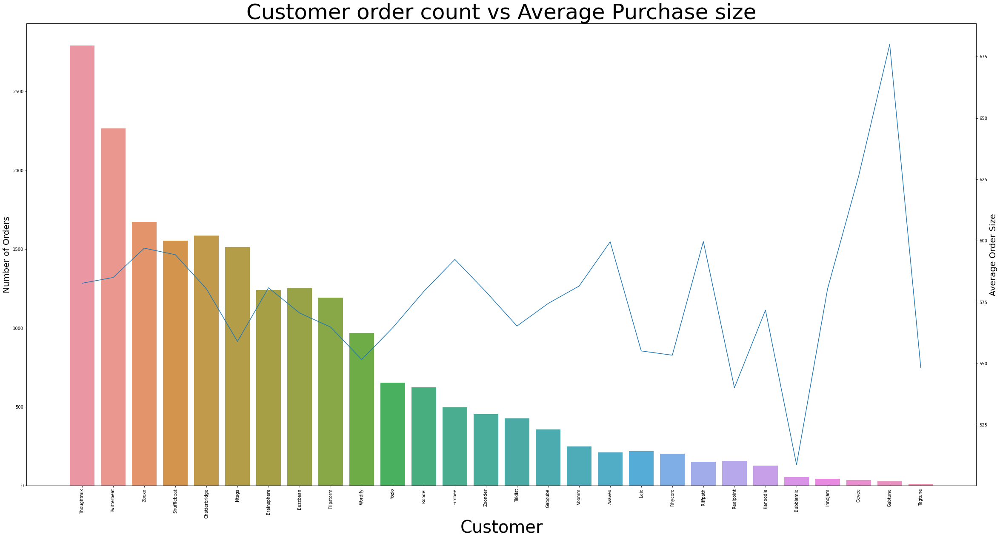

In [74]:
fig,ax=plt.subplots(figsize=(40,20))

# ax2
sns.barplot(rev_gen_by_cust_pd['company'],rev_gen_by_cust_pd['order_counts'])
plt.xticks(rotation='90')
ax2 = plt.twinx()
ax2.plot(rev_gen_by_cust_pd['company'],rev_gen_by_cust_pd['Average'])
ax2.axes.set_title("Customer order count vs Average Purchase size",fontsize=50)
ax.set_xlabel("Customer",fontsize=40)
ax.set_ylabel("Number of Orders", fontsize = 20)
ax2.set_ylabel("Average Order Size",fontsize=20)
plt.show()

#### 2.3. Which parts have become more popular lately, also which are becoming less popular? (5 pts)

Improving stock turnover is important to a company. Large quantites of a product that don't sell will bring no revenue to the company as well as storage costs. Too few parts of a popular item may lead to possibly lost sales as they risk being sold out.

Compute the answer, plot appropriately, and write a paragraph describing the findings.

In [42]:
def str_distinct_part(part_collect):
    str_parts = '('
    for indx, row in enumerate(part_collect):
        if indx != len(part_collect) - 1:
            str_parts += "'" + row.part + "',"
        else:
            str_parts += "'" + row.part + "')"
    return str_parts

In [83]:
part_collect = spark.sql("""SELECT DISTINCT part FROM df_trans_cleaned""").collect()
query_sum_rev = f'''SELECT * FROM ( SELECT part, month_year,converted_amount FROM df_trans_cleaned) 
        PIVOT (SUM(converted_amount) FOR part IN {str_distinct_part(part_collect)}) ORDER BY month_year'''
pivot_table_sql_total_rev = spark.sql(query_sum_rev).toPandas()

In [84]:
pivot_table_sql_total_rev = pivot_table_sql_total_rev.dropna(thresh=50)
pivot_table_sql_total_rev = pivot_table_sql_total_rev.fillna(0)
pivot_table_sql_total_rev['month_year'] = pivot_table_sql_total_rev['month_year'].astype(str)
pivot_table_sql_total_rev.tail(5)

,month_year,98132-889,76314-002,52125-444,55700-014,49738-105,51138-049,76117-001,70253-307,68752-024,...,67046-030,52959-433,49035-530,51531-9500,41167-0843,51346-126,16729-167,68180-121,76335-006,49349-314
31,201808,2286.59,4374.91,284.74,5921.88,4804.79,10048.53,0.00,10579.62,5078.68,...,959.17,1651.89,3672.80,1034.19,571.93,937.02,3986.69,2530.15,762.79,469.92
32,201809,1307.06,3131.14,1642.53,3886.42,2833.58,3411.46,1930.64,5208.48,5879.80,...,709.49,3015.70,1884.93,0.00,1005.77,448.47,1833.87,5852.90,941.22,1493.84
33,201810,883.70,2622.66,1115.32,4077.21,2918.35,7862.82,6086.04,6224.90,7616.80,...,1488.20,4001.61,1989.11,4136.09,2421.97,722.68,2362.31,5617.98,825.77,1957.45
34,201811,397.85,3164.55,1396.50,6665.80,5355.25,5821.14,1914.39,4771.81,8558.97,...,1759.19,3032.99,6388.62,2014.14,1333.79,0.00,3229.08,4268.64,401.32,1464.19
35,201812,791.48,3120.91,1687.56,8591.16,1992.48,11531.53,1770.33,6489.57,5677.10,...,411.55,2657.67,3017.87,5045.10,1823.12,305.70,3888.96,3297.69,394.40,491.92


In [86]:
src = ColumnDataSource(pivot_table_sql_total_rev)
unique_parts = pivot_table_sql_total_rev.columns[1:]
col=palette.viridis(len(unique_parts))
month_year_range =[str(x) for x in pivot_table_sql_total_rev['month_year']]


In [91]:
plots = []
for i in unique_parts:
    p = figure(x_range=month_year_range, plot_height=200,plot_width=550, title=i)
    p.xaxis.major_label_orientation = pi/4
    glyphs = p.vbar(x=month_year_range, top= pivot_table_sql_total_rev[i], width=0.8)
    plots.append(p)
show(gridplot(children = plots, ncols = 4, merge_tools = False))

# same plot as above but based on year

In [92]:
part_collect = spark.sql("""SELECT DISTINCT part FROM df_trans_cleaned""").collect()
query_sum_rev = f'''SELECT * FROM ( SELECT part, year,converted_amount FROM df_trans_cleaned) 
        PIVOT (SUM(converted_amount) FOR part IN {str_distinct_part(part_collect)}) ORDER BY year'''
pivot_table_sql_total_rev = spark.sql(query_sum_rev).toPandas()

In [93]:
pivot_table_sql_total_rev = pivot_table_sql_total_rev.dropna(thresh=50)
pivot_table_sql_total_rev = pivot_table_sql_total_rev.fillna(0)
pivot_table_sql_total_rev['year'] = pivot_table_sql_total_rev['year'].astype(str)
pivot_table_sql_total_rev.tail(5)

,year,98132-889,76314-002,52125-444,55700-014,49738-105,51138-049,76117-001,70253-307,68752-024,...,67046-030,52959-433,49035-530,51531-9500,41167-0843,51346-126,16729-167,68180-121,76335-006,49349-314
0,2016,18201.70,34520.38,15434.08,54322.15,40939.00,110394.99,45223.91,71331.64,73231.81,...,12336.28,35885.28,61584.63,47026.06,27571.68,9571.11,45790.76,56088.91,16407.84,21721.15
1,2017,16802.31,25511.40,17997.14,45244.03,38657.88,72442.46,42580.94,74239.49,77534.73,...,10880.38,32567.54,47263.46,38199.55,15880.77,7593.73,31220.67,41675.64,11692.12,21568.80
2,2018,16408.57,28730.29,16814.45,62301.33,34424.06,89025.40,33115.06,67089.40,75026.47,...,12424.39,29497.72,42996.43,38568.76,20440.54,7683.59,38201.36,36186.02,12197.41,20774.64


In [94]:
src = ColumnDataSource(pivot_table_sql_total_rev)
unique_parts = pivot_table_sql_total_rev.columns[1:]
col=palette.viridis(len(unique_parts))
month_year_range =[str(x) for x in pivot_table_sql_total_rev['year']]


In [97]:
plots = []
for i in unique_parts:
    p = figure(x_range=month_year_range, plot_height=200,plot_width=220, title=i)
    p.xaxis.major_label_orientation = pi/4
    glyphs = p.vbar(x=month_year_range, top= pivot_table_sql_total_rev[i], width=0.8)
    plots.append(p)
show(gridplot(children = plots, ncols = 7, merge_tools = False))

# Answer 
Parts became less popular

41163-428, 48951-4042,76117-001,76454-100,55856-0003,42254-213,65044-3014, 49348-574,68462-565,62011-0219,60505-2867,
58668-4281,51060-032,0268-6107,61398-0828,68084-172,52959-433,49035-530,68180-121

Parts became popular

52125-136,54973-9150,54868-0823

#### 2.4. What is the average price paid for a part and the price history for parts? (5 pts)

Identify product trends. If a product is very expensive and purchase orders are going down, it might be worth considering the price of the item, as well as its relevance in the market. If a product has suddenly become very popular, it could be interesting to increase the price and see if costumers will continue to buy it, as this could increase profit for the company.

Compute the answer, plot appropriately, and write a paragraph describing the findings.

In [98]:
trans_parts = df_trans_cleaned.select("date_only","part", "converted_amount").groupBy("date_only")\
                        .agg((f.avg("converted_amount")).alias("mean")).toPandas()

In [99]:
trans_parts["date_only"] = pd.to_datetime(trans_parts["date_only"], format = "%Y-%m-%d")
trans_part_pd = trans_parts.groupby(trans_parts['date_only'].dt.to_period('Q')).mean().astype(int).reset_index()
trans_part_pd["date_only"] = trans_part_pd["date_only"].astype(str)

Average Price for a part: 577.9618510223961


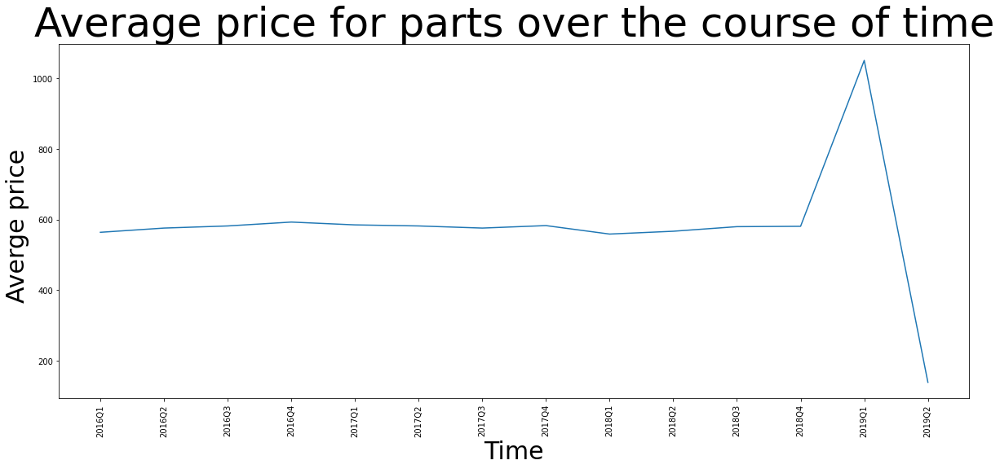

In [103]:
print("Average Price for a part:", df_trans_cleaned.agg(f.mean("converted_amount")).collect()[0][0])


fig,ax=plt.subplots(figsize=(20,8))

# ax2
plt.xticks(rotation='90')
ax.plot(trans_part_pd['date_only'],trans_part_pd["mean"])
ax.axes.set_title("Average price for parts over the course of time",fontsize=50)
ax.set_xlabel("Time",fontsize=30)
ax.set_ylabel("Averge price ", fontsize = 30)
plt.show()

In the graph above, it is seen that the average price for the parts have been quite steady througout the years. Then in the 4th quarter of 2018, prices are spiking into 2019, to then drop. The drop can also be caused be missing data.

#### Digging into a single part to see its price history - part chosen is: 61398-0828

In [104]:
trans_part_one = df_trans_cleaned.filter(f.col("part")== "61398-0828").groupBy("date_only")\
                        .agg((f.avg("converted_amount")).alias("mean"), f.count("part").alias("Order Count")).toPandas()
trans_part_one["date_only"] = pd.to_datetime(trans_part_one["date_only"], format = "%Y-%m-%d")
trans_part_one = trans_part_one.groupby(trans_part_one['date_only'].dt.to_period('Q')).sum().astype(int).reset_index()
trans_part_one["date_only"] = trans_part_one["date_only"].astype(str)

In [105]:
trans_part_one.head()

,date_only,mean,Order Count
0,2016Q1,7825,22
1,2016Q2,7041,21
2,2016Q3,7077,19
3,2016Q4,4326,13
4,2017Q1,4947,12


In [106]:
trans_part_one["mean"].mean()

5615.416666666667

Average Price for a part: 5615.416666666667


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


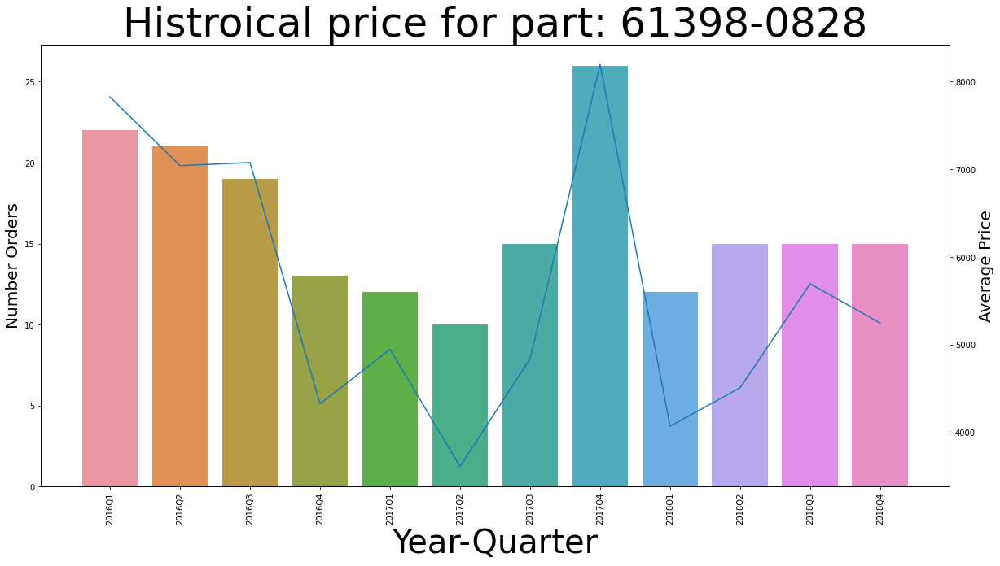

In [108]:
print("Average Price for a part:",trans_part_one["mean"].mean())
fig,ax=plt.subplots(figsize=(20,10))

# ax2
sns.barplot(trans_part_one['date_only'],trans_part_one['Order Count'])
plt.xticks(rotation='90')
ax2 = plt.twinx()
ax2.plot(trans_part_one['date_only'],trans_part_one['mean'])
ax2.axes.set_title("Histroical price for part: 61398-0828",fontsize=50)
ax.set_xlabel("Year-Quarter",fontsize=40)
ax.set_ylabel("Number Orders", fontsize = 20)
ax2.set_ylabel("Average Price",fontsize=20)
plt.show()

The chart above shows how the historical price for the part has evovled over time, along with the amount of orders for the specific part. It can be seen that the part was quite popular 2016, and then decreased in 2017. Then as the price dropped througout 2017, the part became more popular as the price declined, and the price and order amounts went to an all time high in the fourth quarter in 2017. It could not hold the price, and sales decrease. The price converged towards the average price of the part, and held a stady sales throughout 2018.

### Are there any clients for which profit is declining? (12.5 pts)

Declining profit from a specific client may indicate that the client is dissatisfied with the product. Gaining a new client is often much more work than retaining one. Early warnings about declining profit may help your boss fighting customer churn. Answer the following questions and provide appropriate visualisations for each of them. As mentioned before, include headers, legends and well-written descriptions for graphs/charts.


#### 2.5. Compute and visualise the trend in total purchases for all customers, per yearly quarter. (5 pts)


You should also add a paragraph describing your findings.

In [56]:
quarter_dict = {1:'1st',2:'1st',3:'1st',4:'2nd',5:'2nd',6:'2nd',7:'3rd',8:'3rd',9:'3rd',10:'4th',11:'4th',12:'4th'}
def make_quarter(month,year):
    return str(year) + '-' + quarter_dict[month]
    
make_quarter_udf = f.udf(make_quarter, StringType())

In [57]:
df_trans_cleaned_quarter = df_trans_cleaned.withColumn('year_quarter', make_quarter_udf(f.col('month'),f.col('year')))
df_trans_cleaned_quarter.createOrReplaceTempView("df_trans_cleaned_quarter")
df_trans_cleaned_quarter.show(5)

+----------+-----------+-------------+---------+--------+-------------------+----------+-------+-------------+----------------+-----+----+----------+------------+
|      part|    company|      country|     city|   price|               date| date_only| amount|currency_code|converted_amount|month|year|month_year|year_quarter|
+----------+-----------+-------------+---------+--------+-------------------+----------+-------+-------------+----------------+-----+----+----------+------------+
| 17156-617| Thoughtmix|     Portugal|Amadora\t| 791.86€|2016-06-32 07:22:28|2016-01-02| 791.86|          EUR|          791.86|    1|2016|    201601|    2016-1st|
|54868-5165|Shufflebeat|     Portugal|    Porto| 525.24€|2016-06-32 08:08:48|2016-01-02| 525.24|          EUR|          525.24|    1|2016|    201601|    2016-1st|
| 0615-7679| Thoughtmix|     Portugal|Amadora\t| 314.43€|         10/04/2017|2016-01-02| 314.43|          EUR|          314.43|    1|2016|    201601|    2016-1st|
| 35356-325|    Wordif

In [58]:
pivot_table_total_pur_quarter = spark.sql("""SELECT * FROM ( SELECT company, year_quarter, converted_amount FROM df_trans_cleaned_quarter) 
        PIVOT (SUM(converted_amount) FOR company IN 
        ('Avaveo', 'Brainsphere', 'Bubblemix', 'Buzzbean', 'Chatterbridge',
       'Eimbee', 'Flipstorm', 'Gabcube', 'Gabtune', 'Gevee', 'Innojam',
       'Kanoodle', 'Lajo', 'Ntags', 'Realpoint', 'Rhycero', 'Riffpath',
       'Roodel', 'Shufflebeat', 'Tagtune', 'Teklist', 'Thoughtmix',
       'Twitterbeat', 'Voomm', 'Wordify', 'Yozio', 'Zoonder', 'Zooxo')) ORDER BY year_quarter""").toPandas()
pivot_table_total_pur_quarter.head(5)

,year_quarter,Avaveo,Brainsphere,Bubblemix,Buzzbean,Chatterbridge,Eimbee,Flipstorm,Gabcube,Gabtune,...,Shufflebeat,Tagtune,Teklist,Thoughtmix,Twitterbeat,Voomm,Wordify,Yozio,Zoonder,Zooxo
0,2016-1st,6959.73,60470.72,375.37,60269.82,82418.20,18452.33,251757.19,18075.57,2258.69,...,76907.16,158.20,21303.66,131180.20,86759.38,58952.26,35977.33,39199.33,22129.43,83659.43
1,2016-2nd,8417.67,66483.83,2530.26,50681.14,84706.80,22405.09,162364.47,9304.26,1171.13,...,82579.79,NaN,17525.48,125000.46,85389.42,32710.26,47289.62,30179.17,20691.93,92409.02
2,2016-3rd,11123.52,61465.03,3220.11,48627.25,73058.69,23300.77,109180.97,16061.35,943.43,...,77917.76,NaN,21688.81,155542.67,117660.41,19615.16,37204.31,30909.28,28173.65,77369.99
3,2016-4th,12295.87,55755.11,3777.48,66182.44,70638.46,22595.92,55164.58,20967.41,NaN,...,84882.83,411.69,19438.21,133909.17,128821.81,16444.63,54027.63,34523.18,30455.79,76336.43
4,2017-1st,9009.71,58693.79,1559.74,56728.73,72113.91,22466.43,38975.80,17939.09,508.61,...,69641.53,NaN,21011.75,123853.18,122347.85,7424.30,42676.99,28594.90,13686.70,85076.86


In [59]:
company_range = pivot_table_total_pur_quarter.columns[1:]
year_quarter_range =[str(x) for x in pivot_table_total_pur_quarter['year_quarter']]
pivot_table_total_pur_quarter = pivot_table_total_pur_quarter.fillna(0)

In [60]:
plots = []
for i in company_range:
    p = figure(x_range=year_quarter_range, plot_height=200,plot_width=400, title=i)
    p.xaxis.major_label_orientation = pi/4
    glyphs = p.vbar(x=year_quarter_range, top= pivot_table_total_pur_quarter[i], width=0.8, color='lightBlue')
    plots.append(p)
show(gridplot(children = plots, ncols = 3, merge_tools = False))

#### 2.6 Find profit-per-customer trends. (7.5 pts)

Find the customers for which profit declined in 2018, relative to 2016. By how much has profit declined? What are the three customers for which profit is declining the most?

Compute the answer, plot appropriately, and write a paragraph describing the findings.


In [109]:
spark.sql("""select *
              FROM (select company, 20k16, 20k18, 20k18-20k16 as Loss from
             (
             select  company, converted_amount , year 
             FROM df_trans_cleaned
             WHERE year = 2018  OR year = 2016
             ) 
             PIVOT (
             SUM(converted_amount)  
             FOR year IN (2016 as 20k16, 2018 as 20k18)
             )
             )
             WHERE Loss <= 0
             ORDER BY (Loss) ASC
             """).show()

+-----------+------------------+------------------+-------------------+
|    company|             20k16|             20k18|               Loss|
+-----------+------------------+------------------+-------------------+
|  Flipstorm|  578467.209999999|          10379.08| -568088.1299999991|
|      Voomm|127722.30999999998|           1717.72|-126004.58999999998|
|      Yozio|134810.95999999996|109346.01999999996|-25464.940000000002|
|Shufflebeat| 322287.5399999999| 297002.7199999999|-25284.820000000007|
|    Zoonder|          101450.8| 76788.93999999997| -24661.86000000003|
|Brainsphere| 244174.6899999999| 220428.5000000002|-23746.189999999682|
|      Ntags| 289311.8199999998|272259.29999999976| -17052.52000000002|
|   Kanoodle|28277.060000000005|          18683.72| -9593.340000000004|
|       Lajo| 45693.23999999999|39811.679999999986| -5881.560000000005|
|    Wordify|174498.88999999993| 168957.9099999999|  -5540.98000000004|
|  Bubblemix|           9903.22| 9084.689999999999| -818.5300000

### Answer

From the table above, it is seen that some og the top 5 revenues generating customers order has been declining from 2016 to 2018. Flipstorm has drasticly diclined, the drastic fall could indicate that they are either not doing well, or have found a different supplier. The same for Voomm. Shufflebeat has been more or less stabble, but has also reduced some in the order capacity. 

## Part 3: Your own insights (10 pts)

Time to explore the data freely to create two valuable, actionable insights. This is your chance to show your ability to do fully self-directed data analysis. 

Your insights should be non-trivial. A trivial finding would be, e.g., "the number of currencies in which we record transations is $n$". That's not a particularly groundbreaking insight. Dig a bit deeper!

#### 3.1. Add your own query #1 (5 pts)

Impress your boss providing a valuable data-driven insight. Why is this relevant? Describe the query in words and provide appropriate visualisations. Write a paragraph describing your findings.

In [110]:
#Finding out where most customers are located 
findings = spark.sql("""select *
              FROM (select country, 20k16, 20k17, 20k18 from
             (
             select  country, converted_amount  , year 
             FROM df_trans_cleaned 
             WHERE year = 2018  OR year = 2016 OR year = 2017 
             ) 
             PIVOT (
             SUM(converted_amount) as Total 
             FOR year IN (2016 as 20k16, 2017 as 20k17, 2018 as 20k18)
             )
             )
             ORDER BY (20k18) DESC
             
             """)

findings.show()

+--------------+------------------+------------------+------------------+
|       country|             20k16|             20k17|             20k18|
+--------------+------------------+------------------+------------------+
|      Portugal| 1201185.659999997|1496913.2300000004|1568080.2299999986|
|        France| 691756.4099999988| 661048.9000000005| 659940.6300000005|
|United Kingdom|253992.56999999998|         318241.14| 329234.4199999998|
|         Spain| 236713.8100000001| 275933.1300000004| 312331.4300000001|
|       Germany|166326.77000000005| 219625.5400000001| 257419.6700000002|
| United States|194413.99999999997| 254260.0999999998|245340.51000000007|
|        Greece|497227.66999999987|226094.71999999988|189224.65000000005|
|   Netherlands| 66445.48999999999| 80808.22000000002|           94485.3|
|         Japan|25478.520000000004|32455.969999999998|27647.949999999997|
|   Switzerland|             158.2|2011.7199999999998|           3998.03|
|       Portuga|              null|   

In [111]:
country_rev = df_trans_cleaned .groupBy("year").pivot("country").agg(f.sum("converted_amount").cast(IntegerType())).orderBy(f.asc("year")).toPandas()
country_rev["year"] = country_rev["year"].astype(str)

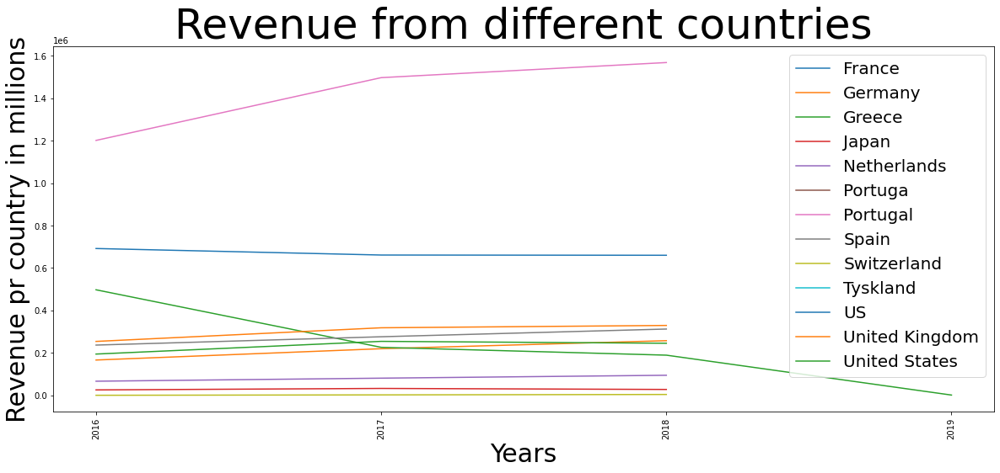

In [114]:
fig,ax=plt.subplots(figsize=(20,8))

# ax2
plt.xticks(rotation='90')
for i in country_rev.columns[2:]:
    ax.plot(country_rev['year'],country_rev[i], label=i)
ax.axes.set_title("Revenue from different countries",fontsize=50)
ax.set_xlabel("Years",fontsize=30)
plt.legend(prop={"size":20})
ax.set_ylabel("Revenue pr country in millions", fontsize = 30)
plt.show()

### Answer

In the plot present above, revenues are segemnted into the different countries where the company is present in. This is a good basic visual, to see how the different market shares are performing, if they are decreasing or increasing. This will also help to enable are more target specific marketing campaign or others, inorder to increase the sales in that region. 

In the plot it is seen that sales in Portugal have kept increasing over the years, which indicates that there are some loyal customers in the region, and that the servicce might be good there. On the the other side of the scale, there is a steady decrease in performance in Greece. Can be due to presence or poor service be the. company. This should be adressed, since they have gone from thirds most revenue generating country to the worst. 

#### 3.2. Add your own query #2 (5 pts)

Impress your boss providing a valuable data-driven insight. Why is this relevant? Describe the query in words and provide appropriate visualisations. Write a paragraph describing your findings.

In [120]:
###which product is more popular in each country
country_order = (df_trans_cleaned
    .groupby(f.col('country'),f.col('part'))
    .agg(f.sum('converted_amount'),f.count('part').alias('total_orders'))
     .orderBy('sum(converted_amount)',ascending = False).filter(f.col('country').isNotNull())
    .toPandas()
)

In [121]:
country_order

,country,part,sum(converted_amount),total_orders
0,Portugal,51346-145,111206.98,114
1,Portugal,51138-049,109080.40,112
2,Portugal,68462-565,108317.23,120
3,Portugal,17156-617,102949.32,102
4,Portugal,51523-002,92295.40,102
...,...,...,...,...
885,Japan,54868-0823,150.64,1
886,Japan,67046-030,142.14,1
887,Japan,16590-177,117.57,1
888,Netherlands,59779-601,113.90,1


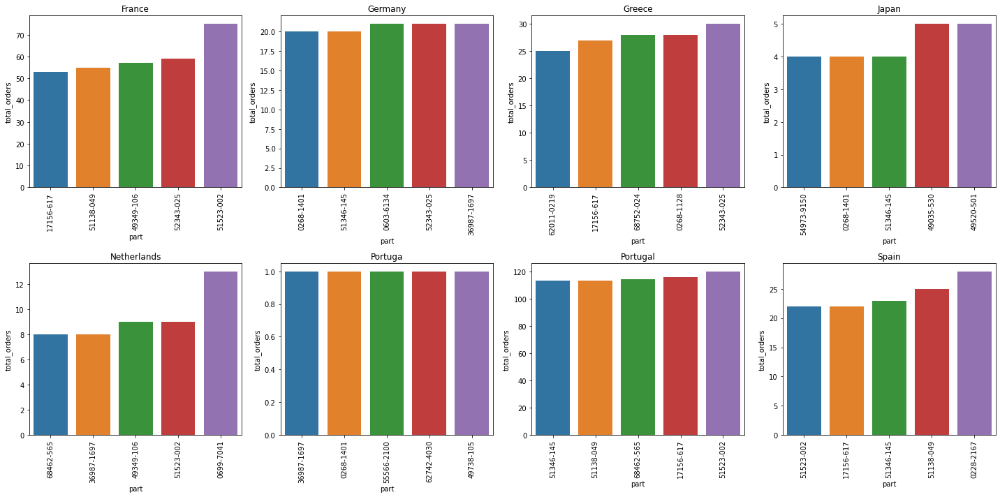

In [127]:
country_lst = np.sort(np.unique(country_order['country']))[0:8]

fig, axes = plt.subplots(2,4,figsize=(20, 10))

m = 0
n = 0

for i,country in enumerate(country_lst):
    df = pd.DataFrame()
    x_value = country_order[country_order.country == country]['part']
    y_value = country_order[country_order.country == country]['total_orders']
    df['part'] = x_value
    df['total_orders'] = y_value
    df = df.sort_values(by = ['total_orders'])[-5:]
    
    if n >= 4:
        m +=1
        n = 0
    #print(m)
    ax = sns.barplot(ax= axes[m,n],x = df['part'],y = df['total_orders'])
    ax.set_xticklabels(x_value, rotation= '90' )
    axes[m,n].set_title(country)
    n+= 1
    fig.tight_layout()
plt.show()

#### Answer:

The plot above shows the top 5 best-seller in each country. It is clear to see that different countries have different preference. Based on the plots above, the company can make different strategies for each market.

For example, product 52523-002 sells well in France, which means the local market has great demand. Then the company can produce and store more of this product in that specific market. In addition, it can make advertisments to attract new costumers who need this product.